# YouTube on Android

The goal of this experiment is to run Youtube videos on a Pixel device running Android and collect results.

In [1]:
from conf import LisaLogging
LisaLogging.setup()

2017-12-15 11:34:03,534 INFO    : root         : Using LISA logging configuration:
2017-12-15 11:34:03,536 INFO    : root         :   /usr/local/google/home/kevindubois/source/android-git_master/external/lisa/logging.conf


In [2]:
%pylab inline

import json
import os

# Support to access the remote target
import devlib
from env import TestEnv

# Import support for Android devices
from android import System, Screen, Workload

# Support for trace events analysis
from trace import Trace

# Suport for FTrace events parsing and visualization
import trappy

import pandas as pd
import sqlite3

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python2.7/dist-packages/pandas/core/computation/__init__.py:18: UserWarning: The installed version of numexpr 2.2.2 is not supported in pandas and will be not be used
The minimum supported version is 2.4.6

  ver=ver, min_ver=_MIN_NUMEXPR_VERSION), UserWarning)


## Support Functions

This function helps us run our experiments:

In [3]:
def experiment():
    
    # Configure governor
    target.cpufreq.set_all_governors('sched')

    # Get workload
    wload = Workload(te).getInstance(te, 'YouTube')
    
    # Run Youtube workload
    wload.run(te.res_dir, 'https://youtu.be/XSGBVzeBUbk?t=45s',
              video_duration_s=60, collect='ftrace')

    # Dump platform descriptor
    te.platform_dump(te.res_dir)

## Test environment setup
For more details on this please check out **examples/utils/testenv_example.ipynb**.

**devlib** requires the ANDROID_HOME environment variable configured to point to your local installation of the Android SDK. If you have not this variable configured in the shell used to start the notebook server, you need to run a cell to define where your Android SDK is installed or specify the ANDROID_HOME in your target configuration.

In case more than one Android device are conencted to the host, you must specify the ID of the device you want to target in **my_target_conf**. Run **adb devices** on your host to get the ID.

In [4]:
# Setup target configuration
my_conf = {
    # Target platform and board
    "platform"     : 'android',
    "board"        : 'pixel',
    
    # Device. If you have more than one, specify the serial number.
    #"device"       : "FA6A10306347",
    
    # Android home, must be configured to host running device
    "ANDROID_HOME" : "/usr/local/google/home/kevindubois/Android/Sdk",

    # Folder where all the results will be collected
    "results_dir" : "Youtube_example",

    # Define devlib modules to load
    "modules"     : [
        'cpufreq'       # enable CPUFreq support
    ],

    # FTrace events to collect for all the tests configuration which have
    # the "ftrace" flag enabled
    "ftrace"  : {
         "events" : [
            "sched_switch",
            "sched_wakeup",
            "sched_wakeup_new",
            "sched_overutilized",
            "sched_load_avg_cpu",
            "sched_load_avg_task",
            "cpu_capacity",
            "cpu_frequency",
            "clock_enable",
            "clock_disable",
            "clock_set_rate",
             "irq_handler_entry",
             "irq_handler_exit"
         ],
         "buffsize" : 100 * 1024,
    },

    # Tools required by the experiments
    "tools"   : [ 'trace-cmd', 'taskset'],
}

In [5]:
# Initialize a test environment using:
te = TestEnv(my_conf, wipe=False)
target = te.target

2017-12-15 11:34:04,158 INFO    : TestEnv      : Using base path: /usr/local/google/home/kevindubois/source/android-git_master/external/lisa
2017-12-15 11:34:04,159 INFO    : TestEnv      : Loading custom (inline) target configuration
2017-12-15 11:34:04,160 INFO    : TestEnv      : External tools using:
2017-12-15 11:34:04,161 INFO    : TestEnv      :    ANDROID_HOME: /usr/local/google/home/kevindubois/Android/Sdk
2017-12-15 11:34:04,163 INFO    : TestEnv      :    ANDROID_BUILD_TOP: /usr/local/google/home/kevindubois/source/android-git_master
2017-12-15 11:34:04,164 INFO    : TestEnv      :    TARGET_PRODUCT: walleye
2017-12-15 11:34:04,165 INFO    : TestEnv      :    TARGET_BUILD_VARIANT: eng
2017-12-15 11:34:04,167 INFO    : TestEnv      :    ANDROID_PRODUCT_OUT: /usr/local/google/home/kevindubois/source/android-git_master/out/target/product/walleye
2017-12-15 11:34:04,168 INFO    : TestEnv      :    DEVICE_LISA_HOME: /usr/local/google/home/kevindubois/source/android-git_master/dev

## Workloads execution

This is done using the **experiment** helper function defined above which is configured to run a **Youtube** experiment.

In [6]:
# Intialize Workloads for this test environment
results = experiment()

2017-12-15 11:34:07,971 INFO    : Workload     : Supported workloads available on target:
2017-12-15 11:34:07,973 INFO    : Workload     :   camerapreview, jankbench, youtube, camerastartup, appstartup, geekbench, displayimage, viewerworkload, uibench, idleresume, gmaps, suspendresume, exoplayer, vellamo, systemui
2017-12-15 11:34:07,975 INFO    : Screen       : Setting screen ON
2017-12-15 11:34:10,597 INFO    : Screen       : Force manual orientation
2017-12-15 11:34:10,600 INFO    : Screen       : Set orientation: LANDSCAPE
2017-12-15 11:34:11,995 INFO    : Screen       : Set brightness: 0%
2017-12-15 11:34:15,214 INFO    : System       : Setting screen always on to true
2017-12-15 11:34:15,585 INFO    : YouTube      : FTrace START
2017-12-15 11:34:15,899 INFO    : YouTube      : Play video for 60 [s]
2017-12-15 11:35:16,356 INFO    : YouTube      : FTrace STOP
2017-12-15 11:35:25,359 INFO    : System       : Setting screen always on to false
2017-12-15 11:35:26,655 INFO    : Screen

## Benchmarks results

In [7]:
# Benchmark statistics
db_file = os.path.join(te.res_dir, "framestats.txt")
!sed '/Stats since/,/99th/!d;/99th/q' {db_file}

# For all results:
# !cat {results['db_file']}

Stats since: 593577399423904ns
Total frames rendered: 258
Janky frames: 6 (2.33%)
50th percentile: 5ms
90th percentile: 11ms
95th percentile: 12ms
99th percentile: 23ms


## Traces visualisation

For more information on this please check **examples/trace_analysis/TraceAnalysis_TasksLatencies.ipynb**.

In [8]:
# Parse all traces
platform_file = os.path.join(te.res_dir, 'platform.json')
with open(platform_file, 'r') as fh:
    platform = json.load(fh)
trace_file = os.path.join(te.res_dir, 'trace.dat')
trace = Trace(platform, trace_file, events=my_conf['ftrace']['events'])

trappy.plotter.plot_trace(trace.ftrace)

2017-12-15 11:37:13,584 INFO    : Analysis     : LITTLE cluster average frequency: 0.665 GHz
2017-12-15 11:37:13,585 INFO    : Analysis     : big    cluster average frequency: 0.480 GHz


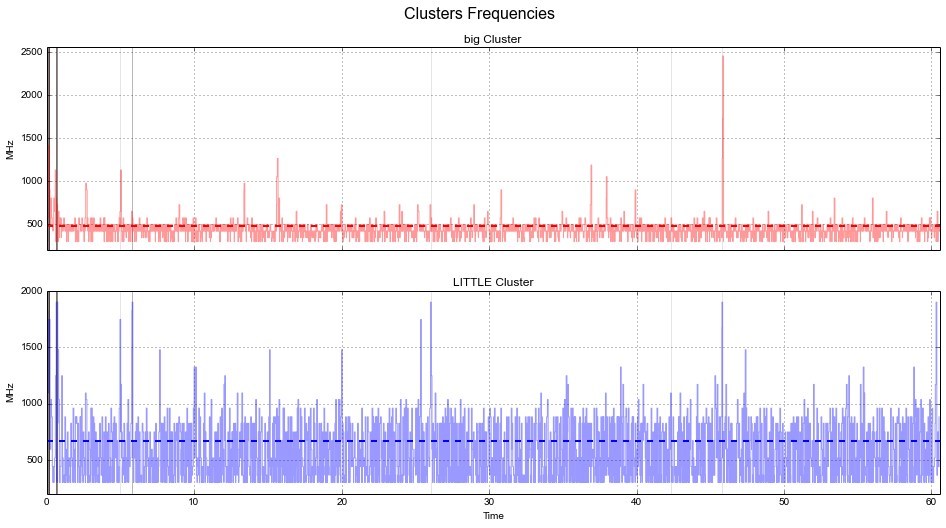

In [9]:
try:
    trace.analysis.frequency.plotClusterFrequencies();
    logging.info('Plotting cluster frequencies for [sched]...')
except: pass

2017-12-15 11:37:14,381 INFO    : Analysis     : LITTLE cluster average frequency: 0.665 GHz
2017-12-15 11:37:14,383 INFO    : Analysis     : big    cluster average frequency: 0.480 GHz


(0.66459671129836262, 0.48041575068044157)

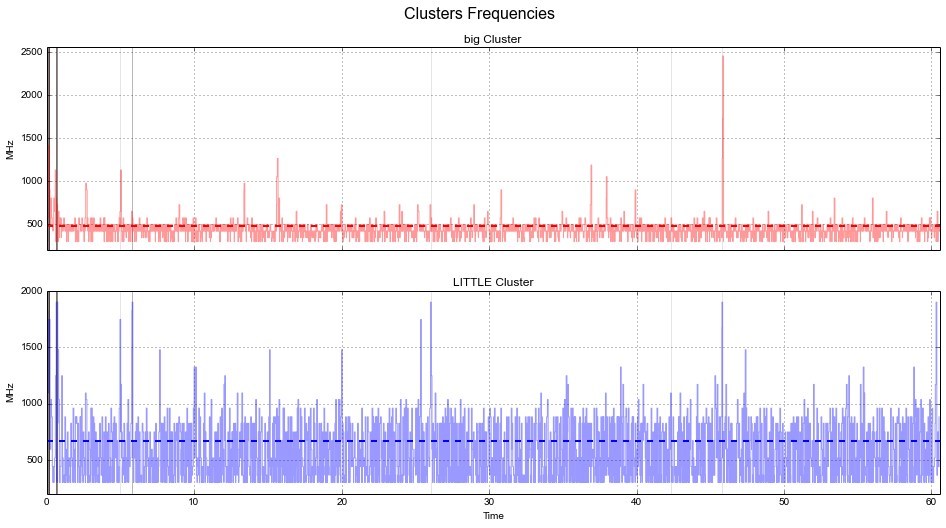

In [10]:
trace.analysis.frequency.plotClusterFrequencies()


/usr/lib/pymodules/python2.7/matplotlib/collections.py:548: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == 'face':


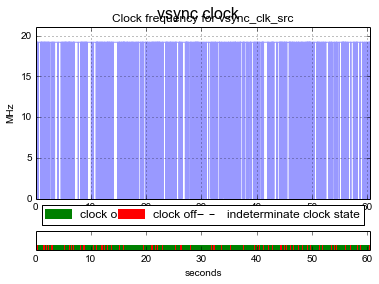

In [11]:
trace.analysis.frequency.plotPeripheralClock(title="vsync clock", clk="vsync_clk_src")


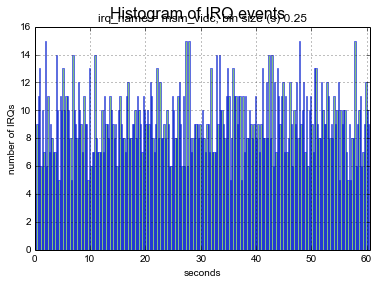

In [12]:
trace.analysis.irq.plotIRQHistogram(irq="msm_vidc")
